<font size="5"> <a href="https://uspdigital.usp.br/jupiterweb/obterDisciplina?sgldis=MAC0209"> Exercício de MAC0209 - Modelagem e Simulação</a> </font>

Bernardo Pereira Silva - 15509206 (IME-USP)

Felipe Cordeiro Caram - 15451151 (IME-USP)

Lucas Martins Próspero - 15471925 (IME-USP)

***
<font size="5"> Modelagem e Simulação da Mobilidade Pedestre </font>
***

# Setup

In [ ]:
# Setup

from google.colab import drive
drive.mount('/content/drive')

import math
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

Mounted at /content/drive


# Lib (Dados Reais)

In [ ]:
# Funções para dados reais

def myPath():
  """
    Identifica o diretório-raiz do projeto.

    Parâmetros:
        None

    Retorna:
        str: Diretório base.
    """
  workDir = '/content/drive/MyDrive/EP02_ModSim/MultiSensorDC/'
  return(workDir)

def max_size(mov, tag):
  """
    Calcula o menor tamanho dentre os tamanhos dos vetores de dados, o que permite
    extrair a maior quantidade possível (max) de informações para estimar a média.

    Parâmetros:
        mov (str): String dentre ["Uniforme, "Uniformevar", "Zuniforme",
        "Zuniformevar"].
        tag (str): String dentre ["Accelerometer","Magnetometer","Gyroscope",
        "Linear Acceleration","Gravity"]

    Retorna:
        int: Quantidade de dados a serem usados no cálculo da média.
    """
  init_path = myPath() + '/' + mov
  recordings = ['Gravação1','Gravação2','Gravação3','Gravação4','Gravação5']

  max_size = 999999

  for rec in recordings:
    final_path = init_path + '/' + rec + '/'
    df_tag = pd.read_csv(final_path + tag + '.csv', sep = ',')
    if(max_size > len(df_tag)):
      max_size = len(df_tag)

  return max_size

def plot_mean(mean_tag, std_tag, t, ylabel, title):
  """
    Plota o gráfico do vetor médio resultante.

    Parâmetros:
        mean_tag (list): Array das médias das medidas (tag) resultantes.
        std_tag (list): Array dos desvios padrões das medidas (tag) resultantes.
        t (list): Array das medições de tempo.
        ylabel (str): Nome da legenda do eixo y.
        title (str): Título principal do plot.

    Retorna:
        None
    """
  plt.figure(figsize=(12, 5))
  plt.xlabel('Tempo (s)')
  plt.ylabel(ylabel)
  plt.title(title + " (Média)")
  plt.grid(True)
  plt.tight_layout()
  plt.plot(t[::40], mean_tag[::40], color = 'darkblue')
  plt.errorbar(t[::40], mean_tag[::40], yerr=std_tag[::40], fmt='o', capsize=0.5, label='Sinal médio ± DP', color = 'red', alpha = 0.5)
  plt.legend()
  plt.show()

def plot_per_axis(x, y, z, t, ylabel, rec, title):
  """
    Plota o gráfico da medida considera por eixo.

    Parâmetros:
        x (list): Array das medições de eixo x.
        y (list): Array das medições de eixo y.
        z (list): Array das medições de eixo z.
        t (list): Array das medições de tempo.
        ylabel (str): Nome da legenda do eixo y.
        rec (str): Nome da gravação.
        title (str): Título principal do plot.

    Retorna:
        None
    """
  plt.figure(figsize=(12, 5))
  ylabel = ylabel.replace("resultante","").strip()
  plt.xlabel('Tempo (s)')
  plt.ylabel(ylabel)
  plt.title(title + ' (' + rec + ')')
  plt.grid(True)
  plt.tight_layout()

  plt.plot(t[::25], x[::25], color = 'blue', label = 'x')
  plt.plot(t[::25], y[::25], color = 'red', label = 'y')
  plt.plot(t[::25], z[::25], color = 'green', label = 'z')
  plt.legend()
  plt.show()

def plot(mov, ylabel, tag, title, showpax=False, showm=False):
  """
    Plota o gráfico das resultantes de "tag" dos cinco experimentos.

    Parâmetros:
        mov (str): String dentre ["Uniforme, "Uniformevar", "Zuniforme",
        "Zuniformevar"].
        ylabel (str): Nome da legenda do eixo y.
        tag (str): String dentre ["Accelerometer","Magnetometer","Gyroscope",
        "Linear Acceleration","Gravity"]
        title (list): Título do plot.
        showpax (boolean): Marcador booleano para mostrar ou não os gráficos de
        cada eixo.
        showm (boolean): Marcador booleano para mostrar ou não o gráfico da média.

    Retorna:
        None
    """
  init_path = myPath() + '/' + mov
  recordings = ['Gravação1','Gravação2','Gravação3','Gravação4','Gravação5']

  size = max_size(mov,tag)
  all_tag = []

  # Experimentos resultantes
  plt.figure(figsize=(12, 5))
  for rec in recordings:
    final_path = init_path + '/' + rec + '/'
    df_tag = pd.read_csv(final_path + tag + '.csv', sep = ',')

    # Vetor resultante
    df_tag[tag] = np.sqrt(df_tag['axis_x']**2 + df_tag['axis_y']**2 + df_tag['axis_z']**2)

    # Medições de tempo convertidas em segundos (com t0 sendo a origem)
    t0 = df_tag['timestamp_nano'].iloc[0]
    df_tag['time'] = (df_tag['timestamp_nano'] - t0) / 1e9

    # Plot do vetor resultante de cada experimento
    ax = np.array(df_tag['time'])
    ay = df_tag[tag]
    plt.plot(ax[::25], ay[::25], label=rec)

    all_tag.append(ay[:size])

  # Média e desvio padrão
  all_tag = np.array(all_tag)
  mean_tag = np.mean(all_tag, axis = 0)
  std_tag = np.std(all_tag, axis = 0)

  # Plot final dos cinco experimentos
  plt.xlabel('Tempo (s)')
  plt.ylabel(ylabel)
  plt.title(title)
  plt.grid(True)
  plt.legend()
  plt.tight_layout()
  plt.show()

  # Plot da média com barra de erro
  if(showm):
    plot_mean(mean_tag, std_tag, ax[:size], ylabel, title)

  # Experimentos por eixos
  if(showpax):
    for rec in recordings:
      final_path = init_path + '/' + rec + '/'
      df_tag = pd.read_csv(final_path + tag + '.csv', sep = ',')

      # Medições de tempo convertidas em segundos (com t0 sendo a origem)
      t0 = df_tag['timestamp_nano'].iloc[0]
      df_tag['time'] = (df_tag['timestamp_nano'] - t0) / 1e9

      # Componentes
      x = np.array(df_tag['axis_x'])
      y = np.array(df_tag['axis_y'])
      z = np.array(df_tag['axis_z'])

      # Plot
      plot_per_axis(x,y,z,np.array(df_tag['time']),ylabel, rec, title)

def timeST(mov,interval):
  """
    Calcula os timestamps com base no acelerômetro.

    Parâmetros:
        mov (str): String dentre ["Uniforme, "Uniformevar", "Zuniforme",
        "Zuniformevar"].
        interval (list): Delimitadores dos timestamps (interval é definido por
        amostragem prévia do gráfico da aceleração resultante para verificar os
        picos de oscilação).

    Retorna:
        list: Array dos timestamps dos experimentos.
    """
  init_path = myPath() + '/' + mov
  tag = "Accelerometer"
  recordings = ['Gravação1','Gravação2','Gravação3','Gravação4','Gravação5']
  timestamps = [[],[],[],[],[]]

  for rec in recordings:
    final_path = init_path + '/' + rec + '/'
    df_tag = pd.read_csv(final_path + tag + '.csv', sep = ',')

    # Aceleração resultante
    df_tag[tag] = np.sqrt(df_tag['axis_x']**2 + df_tag['axis_y']**2 + df_tag['axis_z']**2)

    # Medições de tempo convertidas em segundos (com t0 sendo a origem)
    t0 = df_tag['timestamp_nano'].iloc[0]
    df_tag['time'] = (df_tag['timestamp_nano'] - t0) / 1e9

    # Cálculo dos timestamps
    for i in range(5):
      if(i != 4):
        df_interval = df_tag[(df_tag['time'] >= interval[i]) & (df_tag['time'] <= interval[i+1])]
      else:
        df_interval = df_tag[(df_tag['time'] >= interval[i])]
      tag_max = df_interval[tag].max()
      timestp = df_interval.loc[df_interval[tag] == tag_max, 'time'].values
      timestamps[i].append(timestp)

  # Print dos timestamps
  title = "Timestamps (" + mov + ")"

  print("------------------------------" + title + "------------------------------")
  for i in range(5):
    print("t",end=str(i) + ": ")
    for j in range(5):
      print(timestamps[i][j][0],end=" ")
    print()
  print("----------------------------------------------------------------------"
  + "-"*(3+len(mov)))

  return timestamps

def getV(timestamps):
  """
    Calcula a velocidade média de cada experimento.

    Parâmetros:
        timestamps (list): Array dos timestamps dos experimentos.

    Retorna:
        list: Array das velocidades médias dos experimentos.
  """

  v = []

  for j in range(5):
    # v = dx / dt (a == cte == 0)
    v.append(32 / (timestamps[4][j][0] - timestamps[0][j][0]))

  v = np.array(v)
  return v

def getA(timestamps):
  """
    Calcula a aceleração média de cada experimento.

    Parâmetros:
        timestamps (list): Array dos timestamps dos experimentos.

    Retorna:
        list: Array das acelerações médias dos experimentos.
  """

  a = []

  for j in range(5):
    # a = 2dx / t² (v0 == 0)
    a.append(64 / (timestamps[4][j][0] - timestamps[0][j][0])**2)

  a = np.array(a)
  return a

def plotV(all_v, std_v, title):
  """
    Plota o gráfico da velocidade média de cada experimento.

    Parâmetros:
        all_v (list): Array das velocidades médias dos experimentos.
        std_v (list): Array dos desvios padrões das velocidades médias dos
        experimentos.
        title (list): Título do plot.

    Retorna:
        None
  """
  plt.figure(figsize=(12, 5))
  plt.plot([1,2,3,4,5], all_v, color = 'darkblue')
  plt.errorbar([1,2,3,4,5], all_v, yerr=std_v, fmt='o', capsize=0.5, label='Sinal médio ± DP', color = 'red', alpha = 0.5)
  plt.xlabel('Gravação')
  plt.ylabel('Velocidade média (m/s)')
  plt.title(title)
  plt.grid(True)
  plt.tight_layout()
  plt.legend()
  plt.show()

def plotA(all_a, std_a, title):
  """
    Plota o gráfico da aceleração média de cada experimento.

    Parâmetros:
        all_a (list): Array das acelerações médias dos experimentos.
        std_a (list): Array dos desvios padrões das acelerações médias dos
        experimentos.
        title (list): Título do plot.

    Retorna:
        None
  """
  plt.figure(figsize=(12, 5))
  plt.plot([1,2,3,4,5], all_a, color = 'darkblue')
  plt.errorbar([1,2,3,4,5], all_a, yerr=std_a, fmt='o', capsize=0.5, label='Sinal médio ± DP', color = 'red', alpha = 0.5)
  plt.xlabel('Gravação')
  plt.ylabel('Aceleração média (m/s²)')
  plt.title(title)
  plt.grid(True)
  plt.tight_layout()
  plt.legend()
  plt.show()


# Lib (Dados Simulados)

In [ ]:
# Funções para dados simulados

def fks(k,mi,sigma):
  """
    Calcula o estimador com ruído do modelo.

    Parâmetros:
        k (float): Estimador do modelo.
        mi (float): Média do modelo.
        sigma (float): Desvio padrão do modelo.

    Retorna:
        float: Estimador com ruído do modelo.
  """
  return k + np.random.normal(mi,sigma)

def SVinit():
  """
    Inicializa o vetor de estados.

    Parâmetros:
        None

    Retorna:
        list: Vetor de estados inicializado.
  """
  # x, v, a, t
  return np.zeros(4)

def rate(sv,dt):
  """
    Taxa de variação do vetor de estados por intervalo de tempo.

    Parâmetros:
        sv (list): Vetor de estados.
        dt (float): Intervalo de tempo.

    Retorna:
        list: Array com taxas de variação.
  """
  v,a = sv[1],sv[2]
  dx,dv = v*dt,a*dt
  return np.array([dx,dv,0,dt])

def SVEupdate(sve, r):
  """
    Atualiza o vetor de estados pelo método de Euler.

    Parâmetros:
        sve (list): Vetor de estados (Euler).
        r (list): Taxa de variação.

    Retorna:
        list: Vetor de estados (Euler) atualizado.
  """
  sve
  return sve + r

def SVAupdate(sva,marker,t):
  """
    Atualiza o vetor de estados pelo método Analítico.

    Parâmetros:
        sva (list): Vetor de estados (Analítico).
        dt (float): Intervalo de tempo.
    Retorna:
        list: Vetor de estados (Analítico) atualizado.
  """
  v = sva[1]
  a = sva[2]
  if(marker <=1):
    sva[0] = v*t
  else:
    sva[0] = a*t**2 / 2
    sva[1] = a*t
  sva[3] = t
  return sva

def TSupdate(timestamps,x,t,delta):
  """
    Timestamps simulados.

    Parâmetros:
        timestamps (list): Array de timestamps t0 até t4.
        x (float): Posição atual.
        t (float): Tempo atual.
        delta (float): Margem de tolerância.

    Retorna:
        list: Array de timestamps atualizados.
  """
  if(np.abs(x-8) <= delta and len(timestamps) == 0):
    timestamps.append(t)
  elif(np.abs(x-16) <= delta and len(timestamps) == 1):
    timestamps.append(t)
  elif(np.abs(x-24) <= delta and len(timestamps) == 2):
    timestamps.append(t)
  elif(np.abs(x-32) <= delta and len(timestamps) == 3):
    timestamps.append(t)

  return timestamps

def posR(k,marker,dt):
  """
    Posição real do modelo.

    Parâmetros:
        k (float): Estimador do modelo.
        dt (float): Intervalo de tempo.

    Retorna:
        list: Array de posições reais do modelo.
  """
  xr = [0]
  t = 0
  while (xr[-1] < 32):
    t += dt
    if(marker <= 1):
      xr.append(k*t)
    else:
      xr.append(k*t**2/2)
  return xr

def getVsimu(timestamps):
  """
    Calcula a velocidade média de cada simulação.

    Parâmetros:
        timestamps (list): Array dos timestamps dos experimentos.

    Retorna:
        list: Array das velocidades médias dos experimentos.
  """

  v = []

  for j in range(50):
    # v = dx / dt (a == cte == 0)
    v.append(32 / (timestamps[j][-1]))

  v = np.array(v)
  return v

def getAsimu(timestamps):
  """
    Calcula a aceleração média de cada simulação.

    Parâmetros:
        timestamps (list): Array dos timestamps dos experimentos.

    Retorna:
        list: Array das acelerações médias dos experimentos.
  """

  a = []

  for j in range(50):
    # a = 2dx / t² (v0 == 0)
    a.append(64 / (timestamps[j][-1])**2)

  a = np.array(a)
  return a

def simulateMU(all_k,all_std,N):
  """
    Posição simulada do modelo.

    Parâmetros:
        all_k (list): Array de estimadores do modelo.
        all_std (list): Array de desvios padrões dos estimadores do modelo.
        N (int): Número de simulações

    Retorna:
        None
  """
  for marker,k in enumerate(all_k):
    # Vetores de posições por simulação
    all_xe = []   # Euler
    all_xa = []   # Analítico

    # Posição real
    xr = posR(k,marker,0.001)

    # Vetores de timestamps por simulação
    all_tse = []   # Euler
    all_tsa = []   # Analítico

    # Simulações
    for _ in range(N):
      # Simulação estocástica
      ks = fks(k,0,all_std[marker])

      # Inicialização dos vetores de estado
      sve = SVinit()
      sva = SVinit()

      # {marker <= 1: movimento uniforme (v == cte)}
      # {marker > 1: movimento variado (a == cte)}
      if(marker <= 1):
        sve[1] = ks
        sva[1] = ks
      else:
        sve[2] = ks
        sva[2] = ks

      # Inicialização de parâmetros
      xe = [0]
      xa = [0]
      t = [0]
      dt = 0.001

      # Timestamps
      tse = []   # Euler
      tsa = []   # Analítico

      while (sve[0] < 32):
        r = rate(sve,dt)
        sve = SVEupdate(sve,r)
        sva = SVAupdate(sva,marker,sva[3]+dt)
        xe.append(sve[0])
        xa.append(sva[0])
        t.append(sve[3])
        tse = TSupdate(tse,sve[0],sve[3],1e-1)
        tsa = TSupdate(tsa,sva[0],sva[3],1e-1)

      # Controle de tamanho para posterior uso de 'np.mean'
      if(marker <= 1):
        all_xe.append(xe[:20000])
        all_xa.append(xa[:20000])
      else:
        all_xe.append(xe[:15000])
        all_xa.append(xa[:15000])

      all_tse.append(tse)
      all_tsa.append(tsa)

    # Médias das posições
    mean_xe = np.mean(all_xe, axis = 0)   # Euler
    mean_xa = np.mean(all_xa, axis = 0)   # Analítico

    # Médias e desvios padrões dos timestamps
    mean_tse = np.mean(all_tse, axis = 0)   # Euler
    mean_tsa = np.mean(all_tsa, axis = 0)   # Analítico
    std_tse = np.std(all_tse, axis = 0)
    std_tsa = np.std(all_tsa, axis = 0)

    # Velocidades médias e desvios padrões
    vm_e = np.mean(getVsimu(all_tse))  # Euler
    vm_a = np.mean(getVsimu(all_tsa))  # Analítico
    std_vm_e = np.std(getVsimu(all_tse))
    std_vm_a = np.std(getVsimu(all_tsa))

    # Acelerações médias e desvios padrões
    am_e = np.mean(getAsimu(all_tse))  # Euler
    am_a = np.mean(getAsimu(all_tsa))  # Analítico
    std_am_e = np.std(getAsimu(all_tse))
    std_am_a = np.std(getAsimu(all_tsa))

    # Plots e Prints
    plt.figure(figsize=(12, 5))
    if(marker <= 1):
      if(marker == 0):
        plt.title("Posição média simulada (MU linha reta)")
        print("Timestamps médios (MU linha reta):")
      else:
        plt.title("Posição média simulada (MU zigue-zague)")
        print("Timestamps médios (MU zigue-zague):")
      plt.ylabel('Posição (m)')
      plt.plot(t[:20000],mean_xe, label='Euler',color='blue')
      plt.plot(t[:20000],mean_xa, label='Analítico',linestyle='--',color='red')
      plt.plot(t[:20000],xr[:20000], label='Real',color = 'green', linestyle='-.')
    else:
      if(marker == 2):
        plt.title("Posição média simulada (MUA linha reta)")
        print("Timestamps médios (MUA linha reta):")
      else:
        plt.title("Posição média simulada (MUA zigue-zague)")
        print("Timestamps médios (MUA zigue-zague):")
      plt.ylabel('Posição (m)')
      plt.plot(t[:15000],mean_xe, label='Euler',color='blue')
      plt.plot(t[:15000],mean_xa, label='Analítico',linestyle='--',color='red')
      plt.plot(t[:15000],xr[:15000], label='Real',color = 'green', linestyle='-.')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.xlabel('Tempo (s)')

    # Como todas as simulações partem de x = 0 em t = 0, t0 = 0 para todas
    print("Euler:")
    print("t0:",0, "desvio padrão:",0)
    for i in range(1,5):
      print("t" + str(i) + ":",mean_tse[i-1], "desvio padrão:", std_tse[i-1])
    print("Velocidade média (Euler):", vm_e, "desvio padrão:", std_vm_e)
    print("Aceleração média (Euler):", am_e, "desvio padrão:", std_am_e)
    print("Analítico:")
    print("t0:",0, "desvio padrão:",0)
    for i in range(1,5):
      print("t" + str(i) + ":",mean_tsa[i-1], "desvio padrão:", std_tsa[i-1])
    print("Velocidade média (Analítico):", vm_a, "desvio padrão:", std_vm_a)
    print("Aceleração média (Analítico):", am_a, "desvio padrão:", std_am_a)

    # Visualização do gráfico pós-print
    plt.show()

# Filtro de CSV

In [ ]:
init_path = myPath()

experiments = ['Uniforme','Uniformevar','Zuniforme','Zuniformevar']
recordings = ['Gravação1','Gravação2','Gravação3','Gravação4','Gravação5']
tags = ["Accelerometer","Magnetometer","Gyroscope","Linear Acceleration","Gravity"]

# Salva no drive o csv dos dados divido em categorias
for tag in tags:
  for exp in experiments:
    for rec in recordings:
      final_path = init_path + '/' + exp + '/' + rec + '/'
      df = pd.read_csv(final_path + 'sensors.three.csv', sep = ',')
      df_fil = df[df['name'].str.contains(tag, na=False)]
      df_fil.to_csv(final_path + tag + '.csv', index=False)

# MU em reta

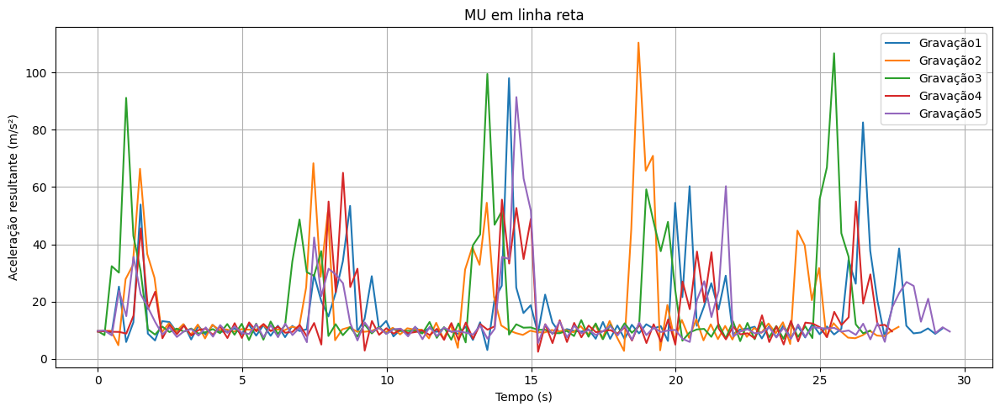

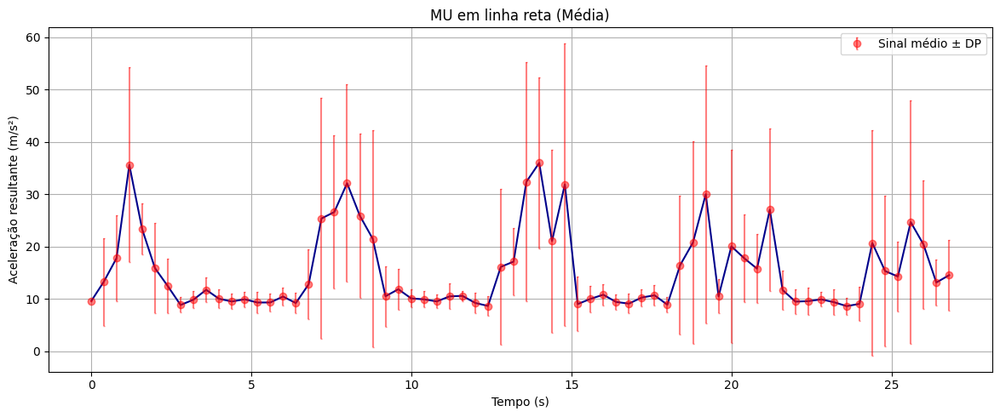

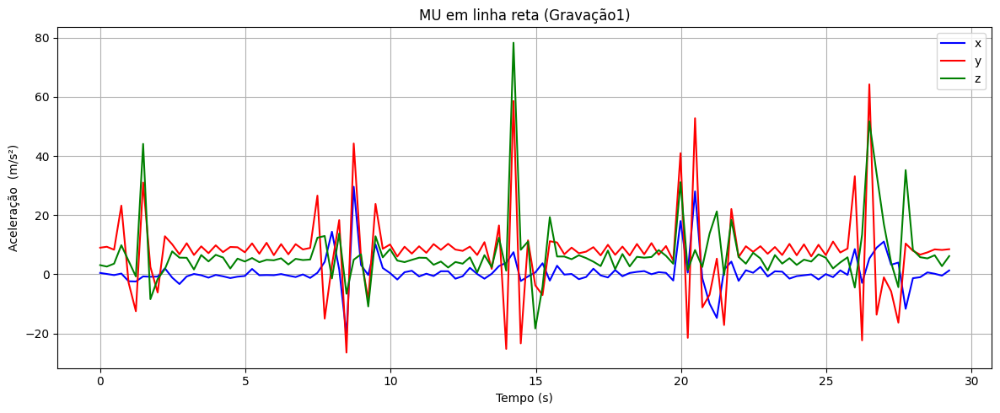

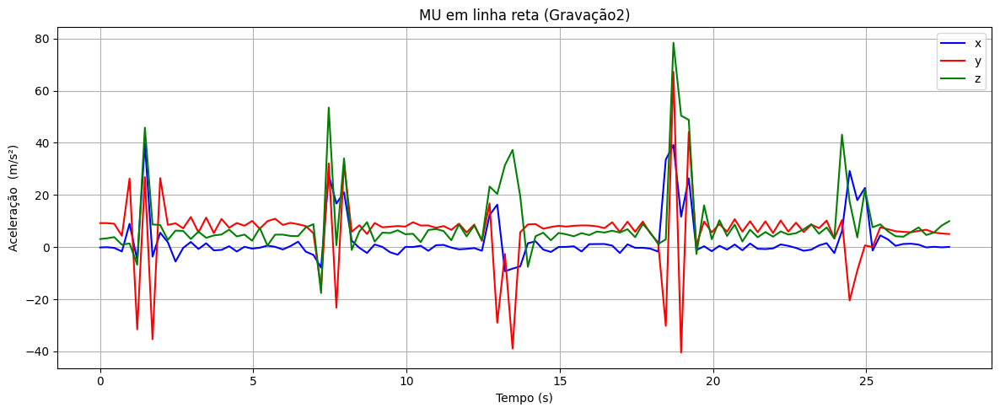

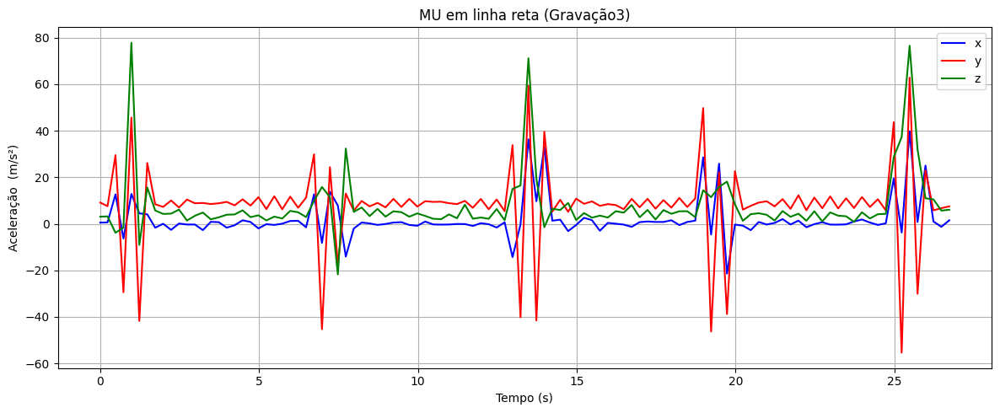

...

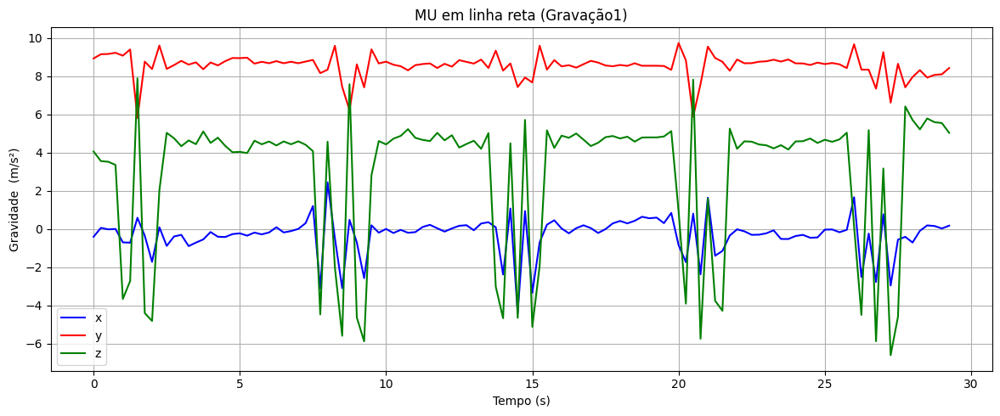

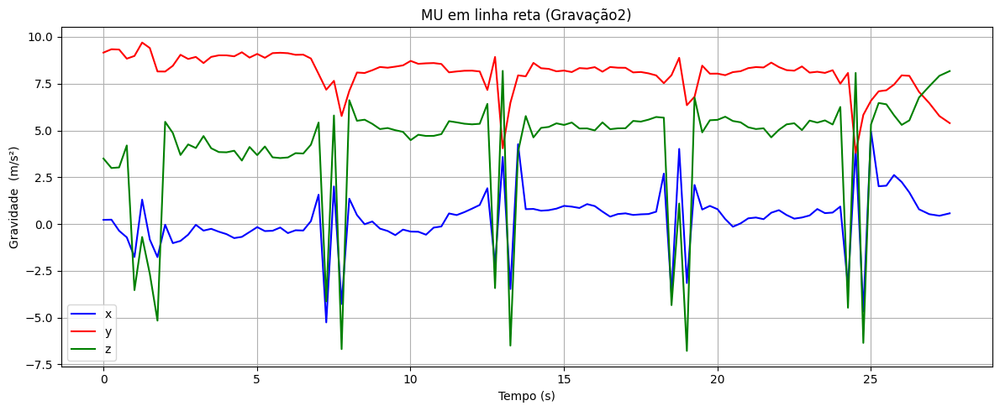

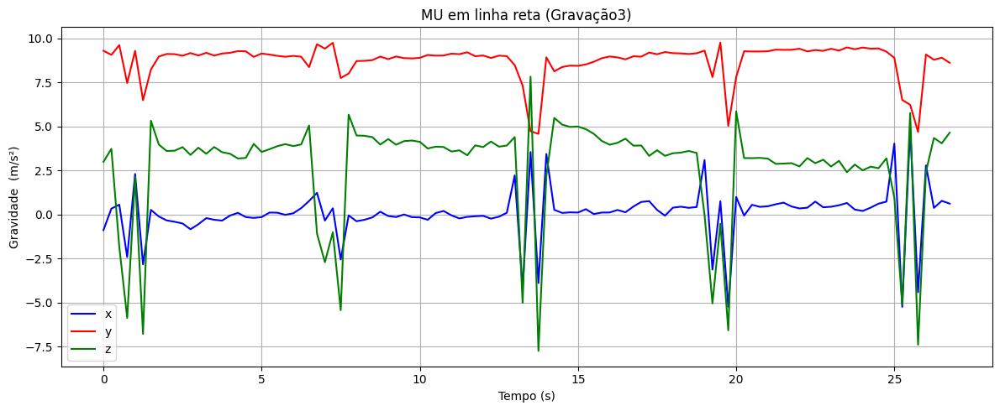

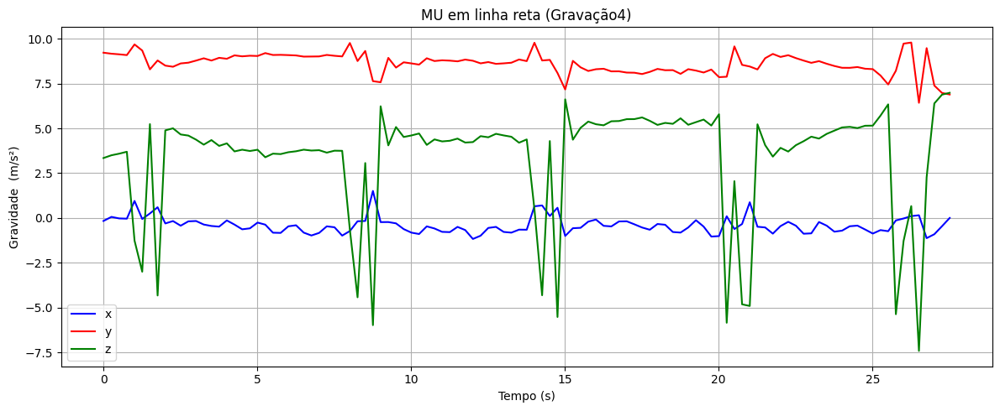

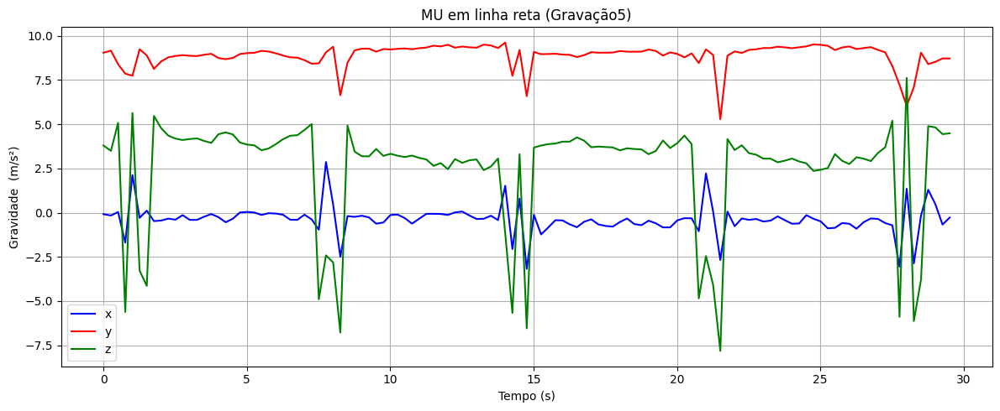

In [ ]:
plot("Uniforme", "Aceleração resultante (m/s²)", "Accelerometer", "MU em linha reta", True, True)
plot("Uniforme", "Intensidade do campo magnético resultante (µT)", "Magnetometer", "MU em linha reta", True, True)
plot("Uniforme", "Velocidade angular resultante (rad/s)", "Gyroscope", "MU em linha reta", True, True)
plot("Uniforme", "Aceleração linear resultante (m/s²)", "Linear Acceleration", "MU em linha reta", True, True)
plot("Uniforme", "Gravidade resultante (m/s²)", "Gravity", "MU em linha reta", True, True)


# MU em zigue-zague

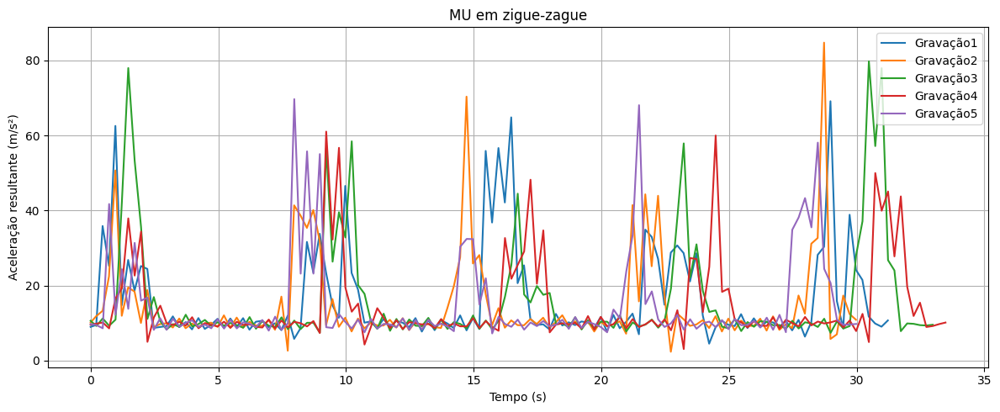

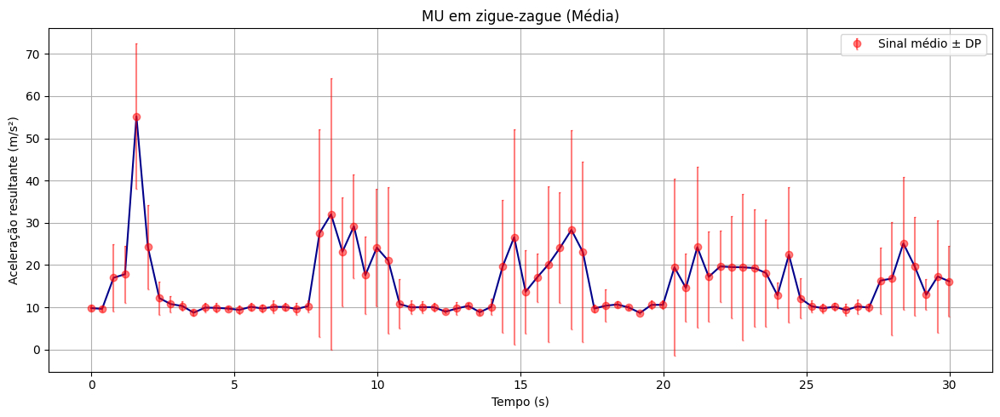

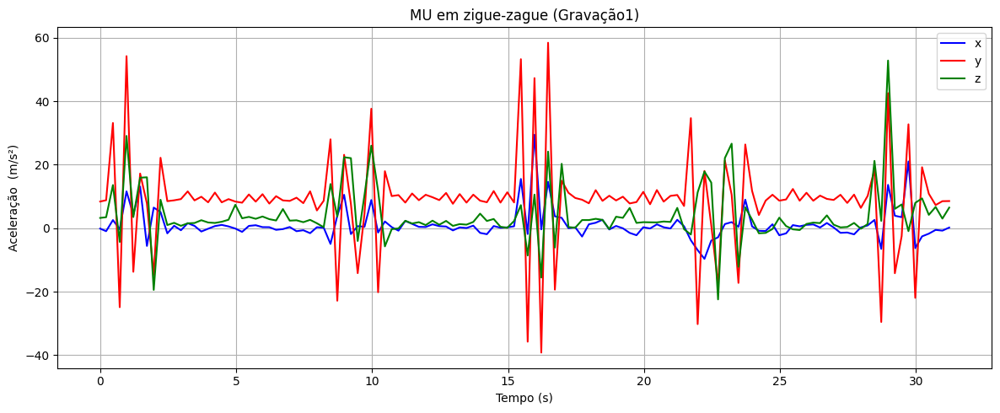

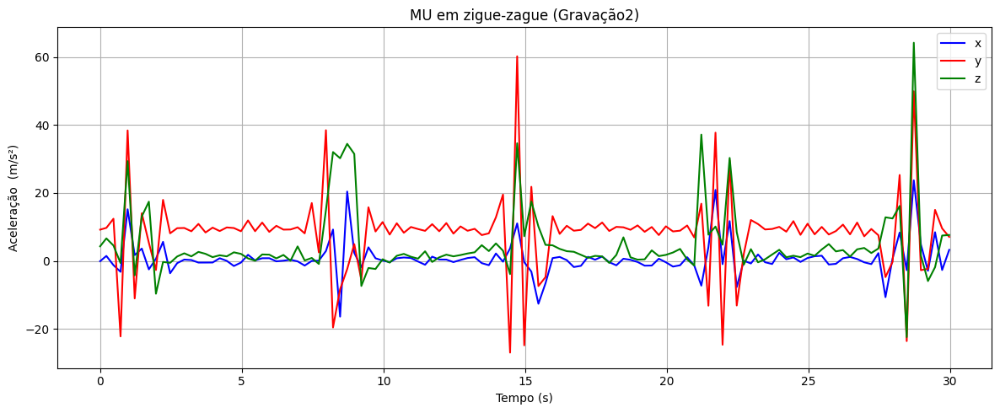

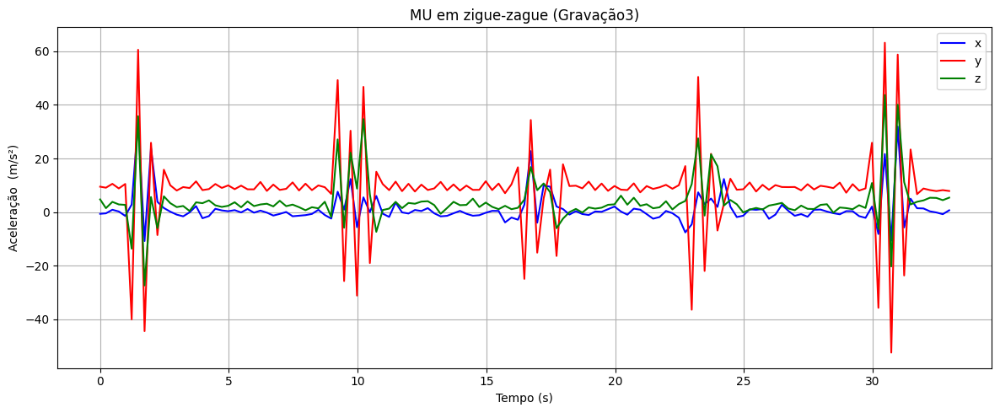

...

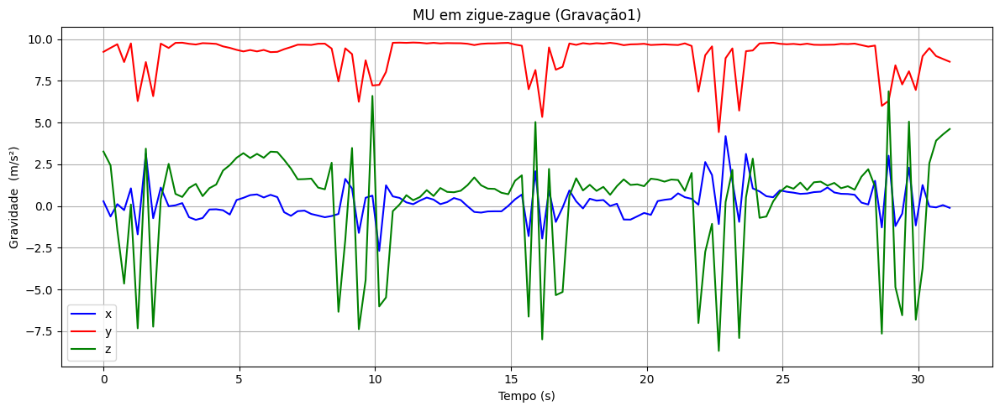

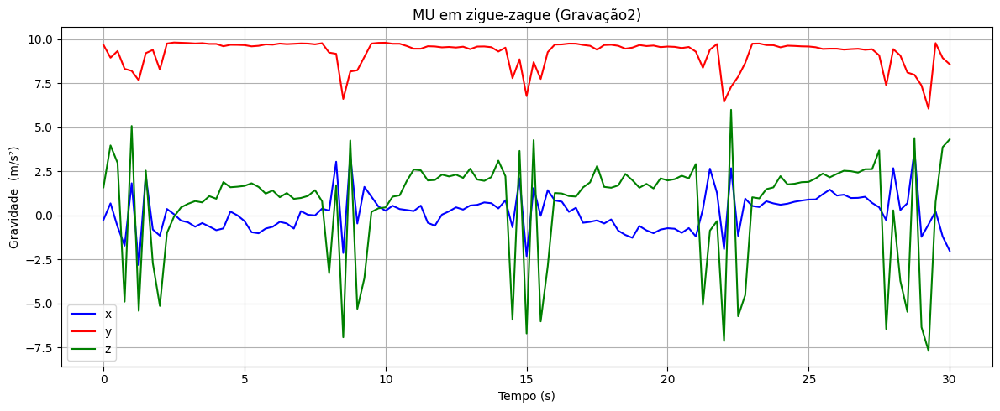

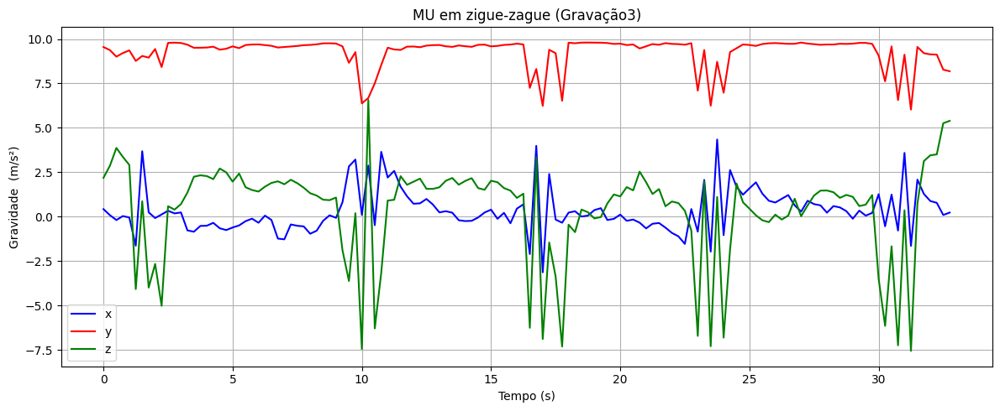

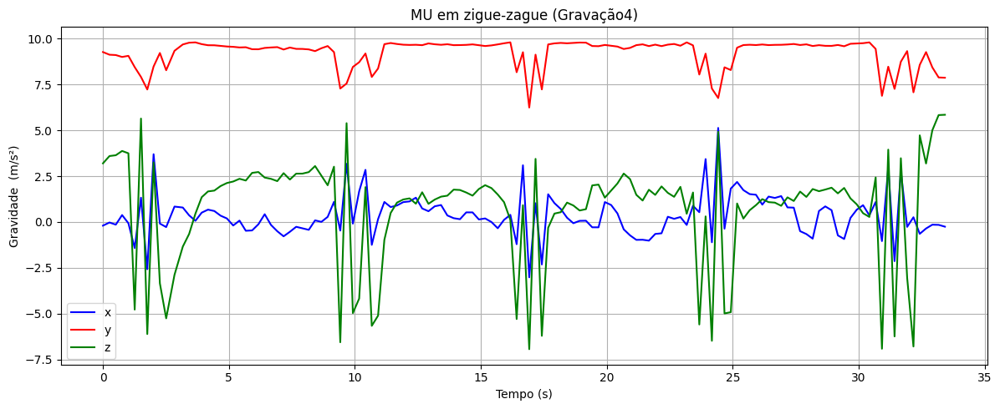

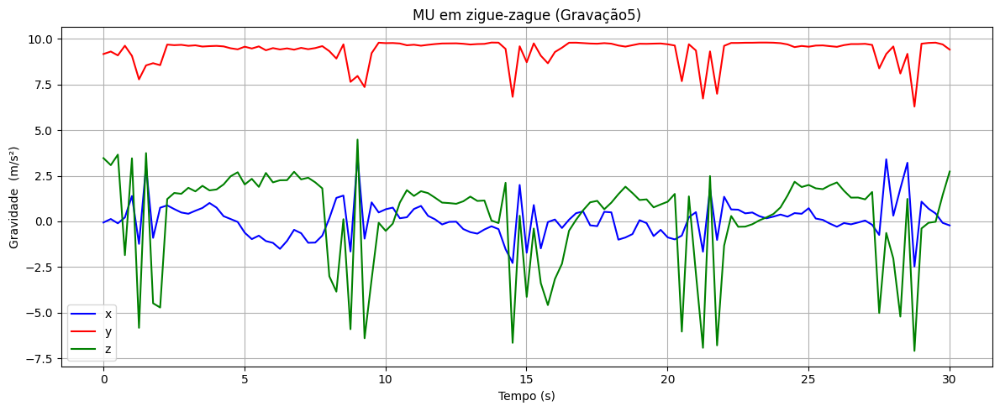

In [ ]:
plot("Zuniforme", "Aceleração resultante (m/s²)", "Accelerometer", "MU em zigue-zague", True, True)
plot("Zuniforme", "Intensidade do campo magnético resultante (µT)", "Magnetometer", "MU em zigue-zague", True, True)
plot("Zuniforme", "Velocidade angular resultante (rad/s)", "Gyroscope", "MU em zigue-zague", True, True)
plot("Zuniforme", "Aceleração linear resultante (m/s²)", "Linear Acceleration", "MU em zigue-zague", True, True)
plot("Zuniforme", "Gravidade resultante (m/s²)", "Gravity", "MU em zigue-zague", True, True)

# MUA em linha reta

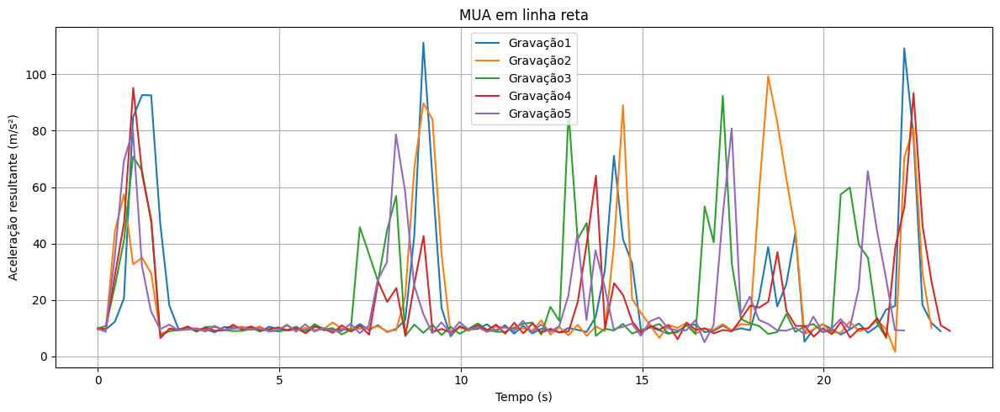

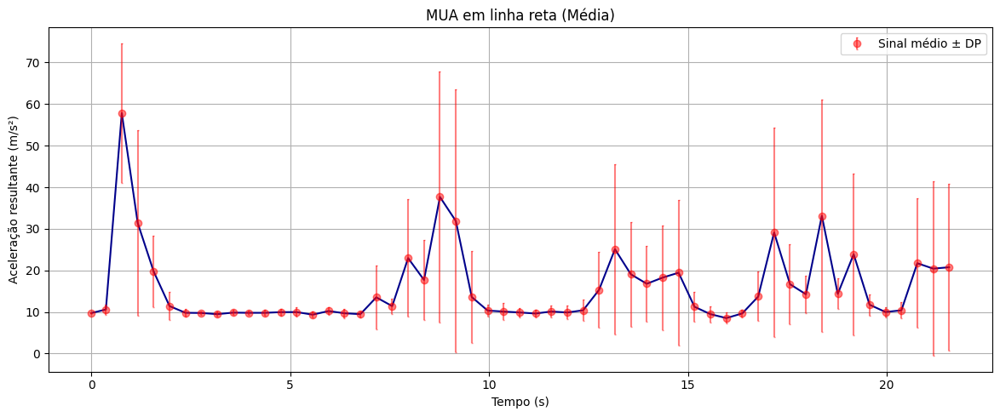

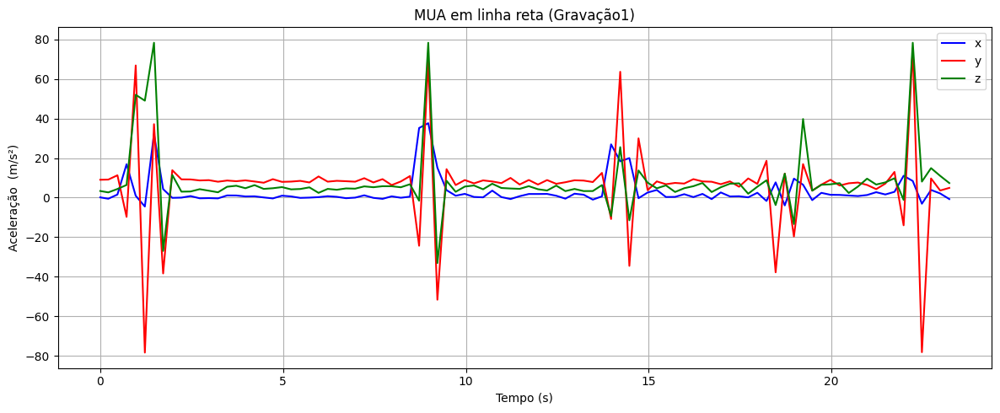

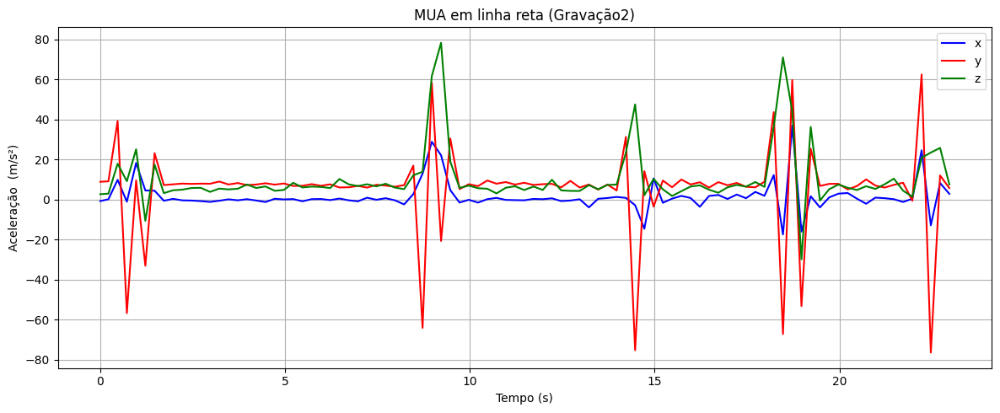

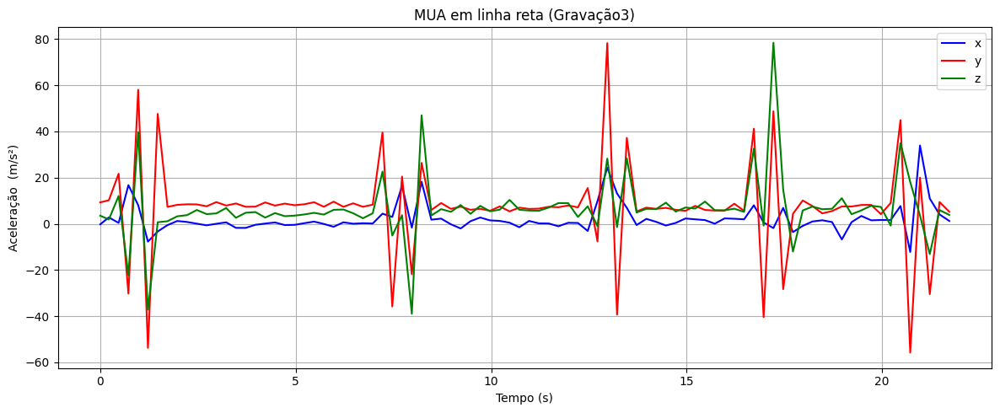

...

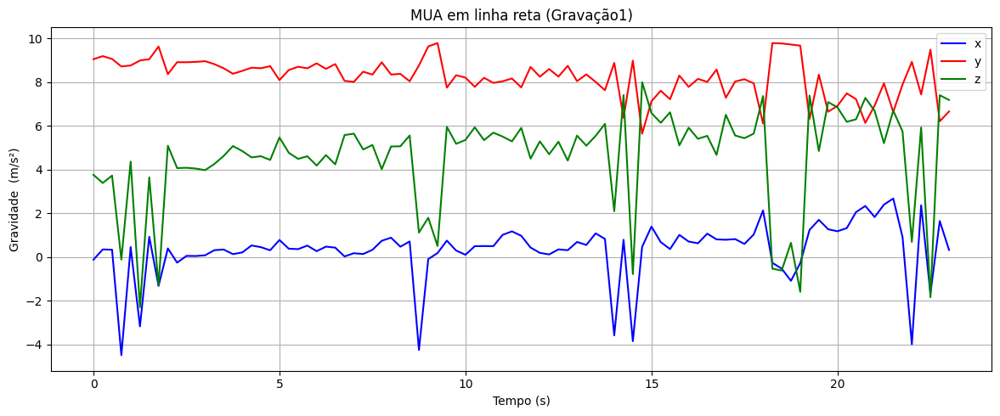

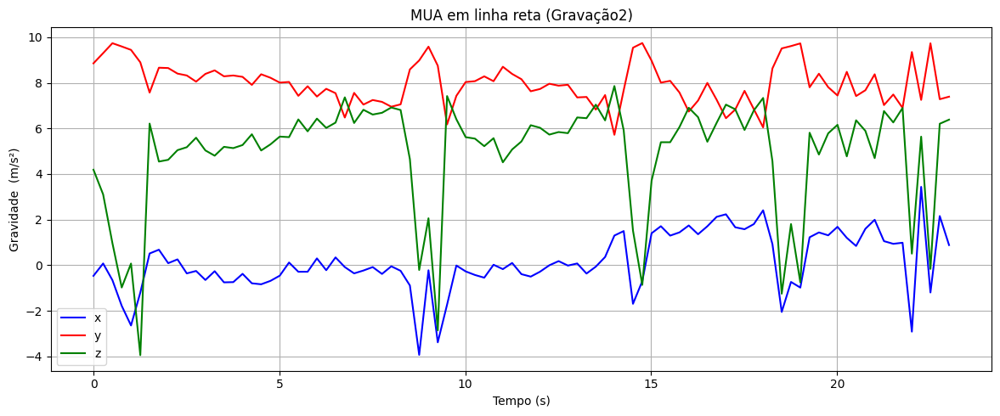

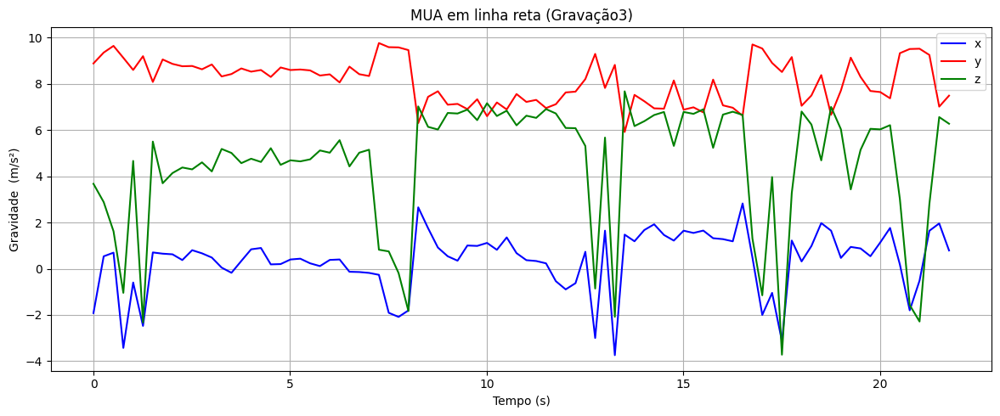

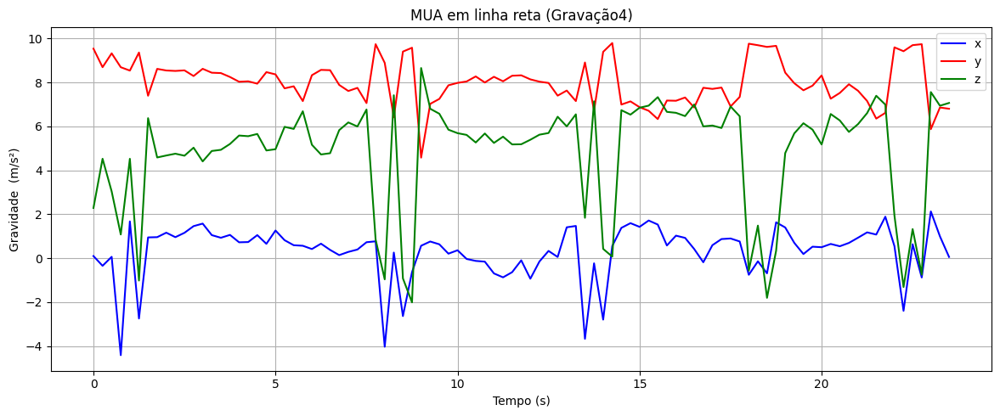

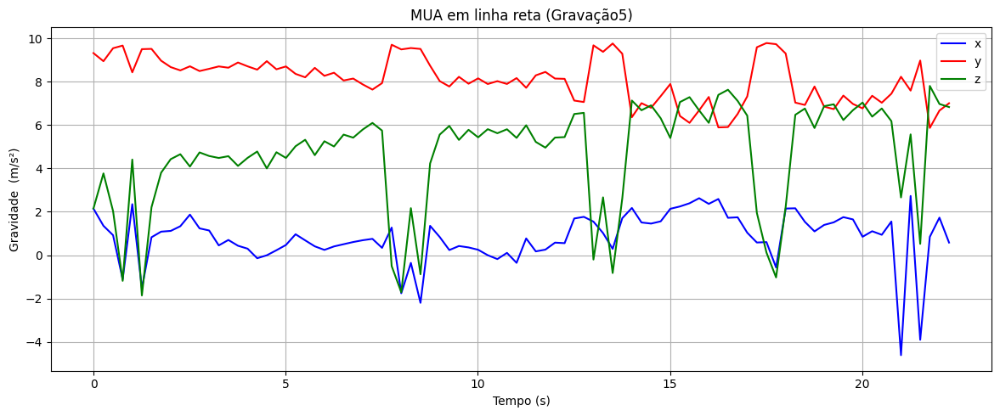

In [ ]:
plot("Uniformevar", "Aceleração resultante (m/s²)", "Accelerometer", "MUA em linha reta", True, True)
plot("Uniformevar", "Intensidade do campo magnético resultante (µT)", "Magnetometer", "MUA em linha reta", True, True)
plot("Uniformevar", "Velocidade angular resultante (rad/s)", "Gyroscope", "MUA em linha reta", True, True)
plot("Uniformevar", "Aceleração linear resultante (m/s²)", "Linear Acceleration", "MUA em linha reta", True, True)
plot("Uniformevar", "Gravidade resultante (m/s²)", "Gravity", "MUA em linha reta", True, True)

# MUA em zigue-zague

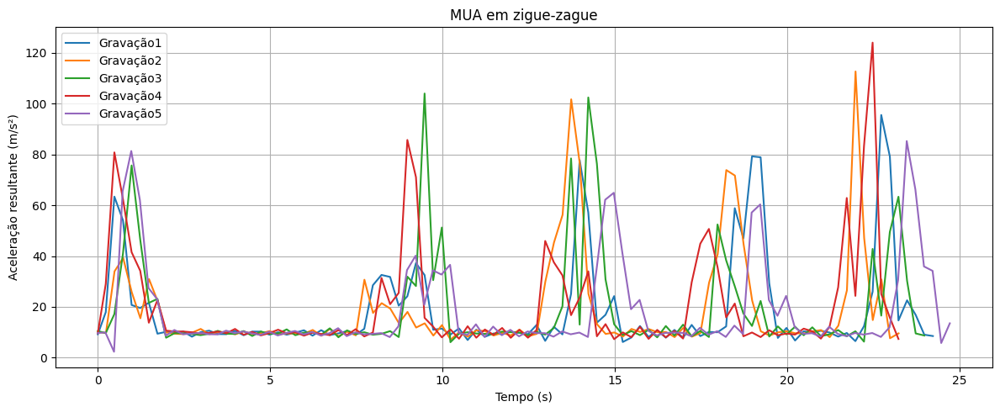

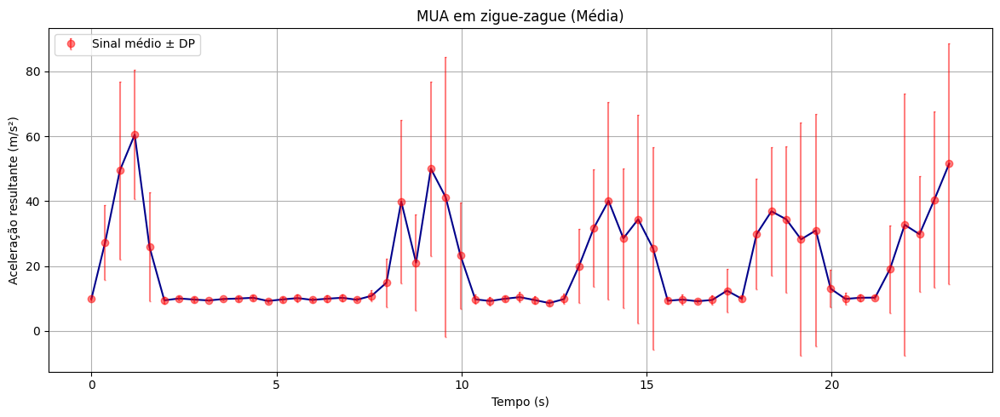

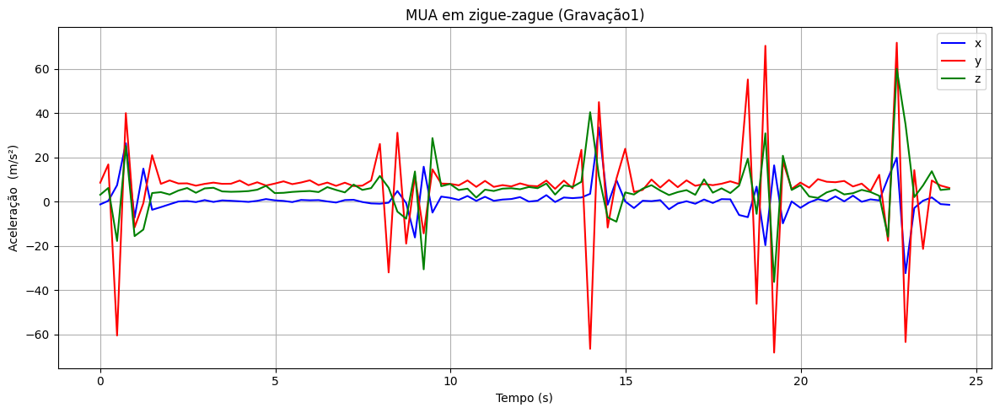

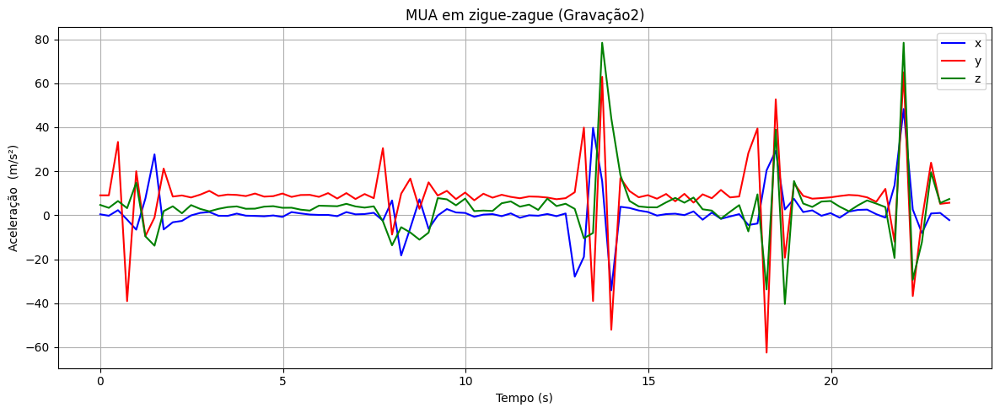

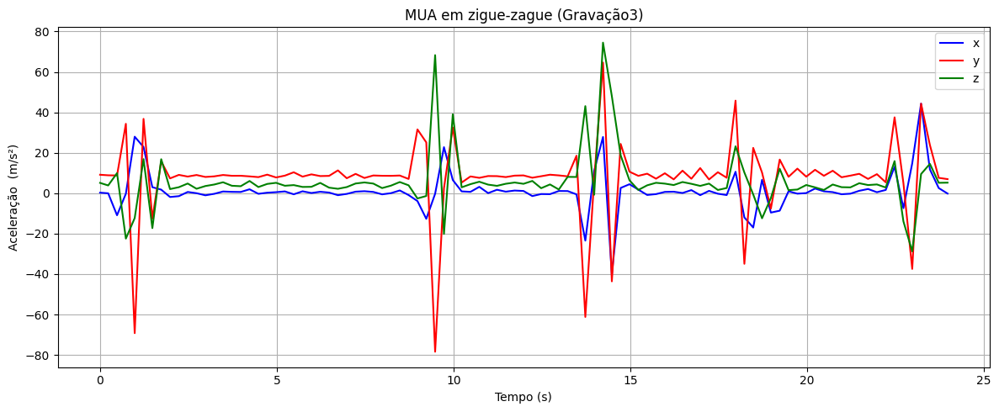

...

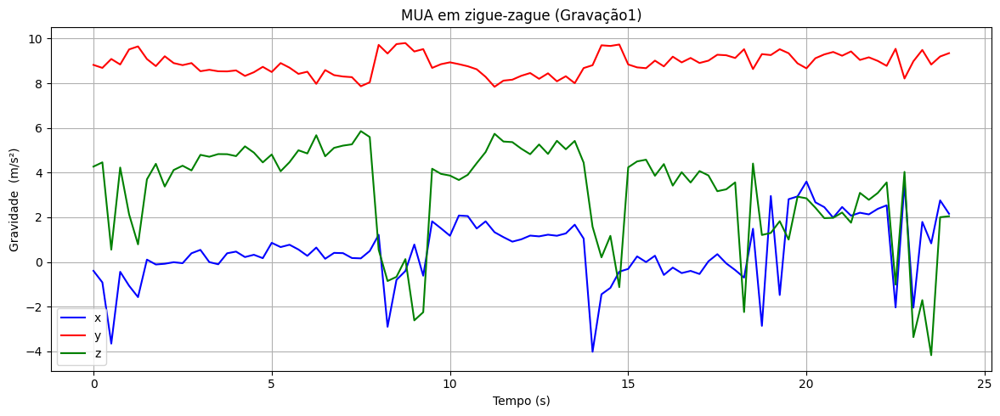

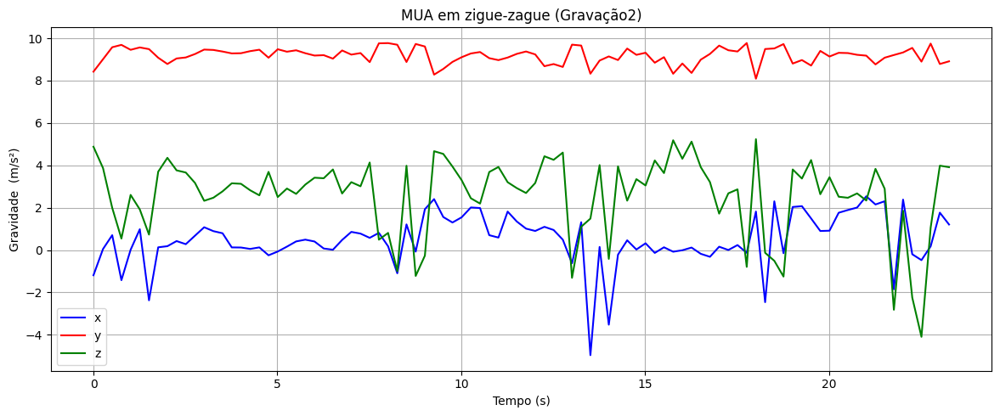

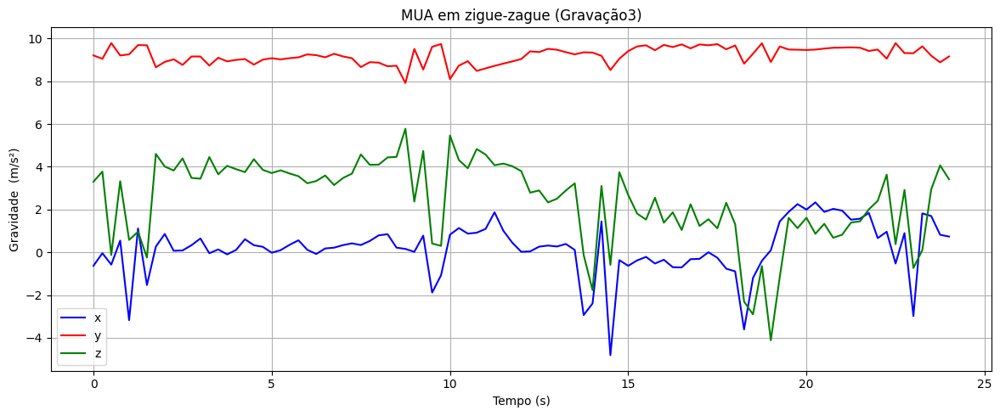

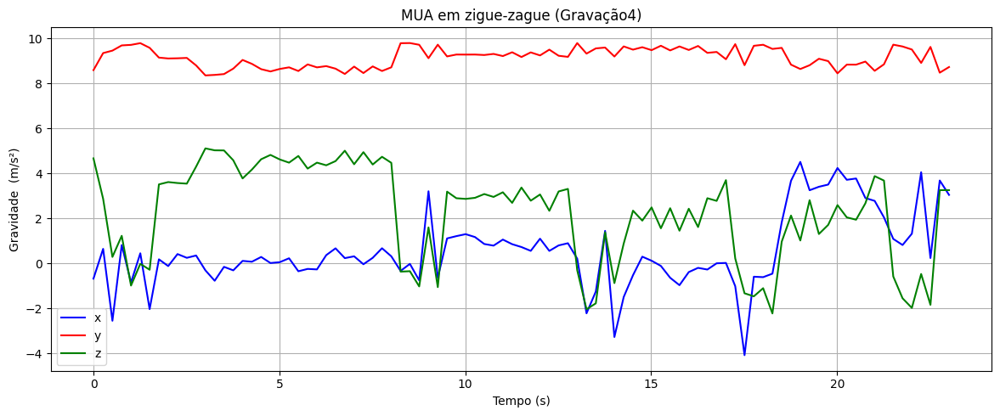

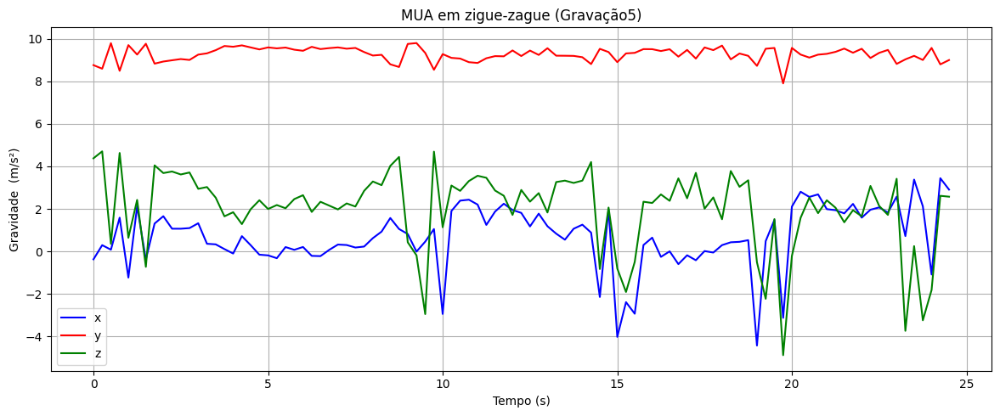

In [ ]:
plot("Zuniformevar", "Aceleração resultante (m/s²)", "Accelerometer", "MUA em zigue-zague", True, True)
plot("Zuniformevar", "Intensidade do campo magnético resultante (µT)", "Magnetometer", "MUA em zigue-zague", True, True)
plot("Zuniformevar", "Velocidade angular resultante (rad/s)", "Gyroscope", "MUA em zigue-zague", True, True)
plot("Zuniformevar", "Aceleração linear resultante (m/s²)", "Linear Acceleration", "MUA em zigue-zague", True, True)
plot("Zuniformevar", "Gravidade resultante (m/s²)", "Gravity", "MUA em zigue-zague", True, True)

# Main

------------------------------Timestamps (Uniforme)------------------------------
t0: 1.460347772 1.400574695 0.950562386 1.455567157 1.125550156 
t1: 8.110333306 7.500550171 7.130555093 8.45549593 7.885597992 
t2: 14.230328629 13.080597774 13.490593704 14.435507021 14.475594316 
t3: 21.110352937 18.701009383 19.421009546 20.615961164 21.135997619 
t4: 27.060384696 24.530995935 25.500535623 26.155524542 28.065563848 
---------------------------------------------------------------------------------
------------------------------Timestamps (Zuniforme)------------------------------
t0: 1.550555377 1.020345156 1.905326147 1.555573465 1.095551387 
t1: 9.940539627 8.360341558 10.265517306 9.225556253 7.965342685 
t2: 15.93056215 14.750296553 16.785536925 16.656213241 14.885325547 
t3: 22.310567088 22.270333633 22.785574542 23.856236617 21.495578312 
t4: 28.940979235 28.720310317 30.445550227 31.166234172 27.915561097 
--------------------------------------------------------------------------

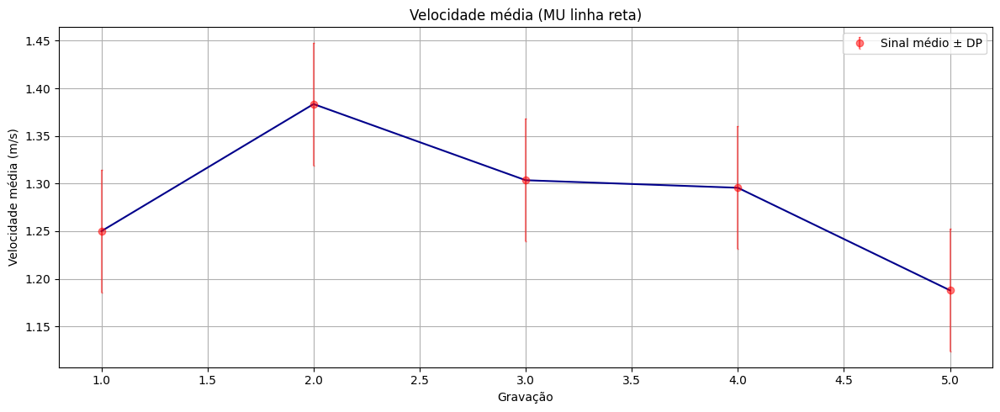

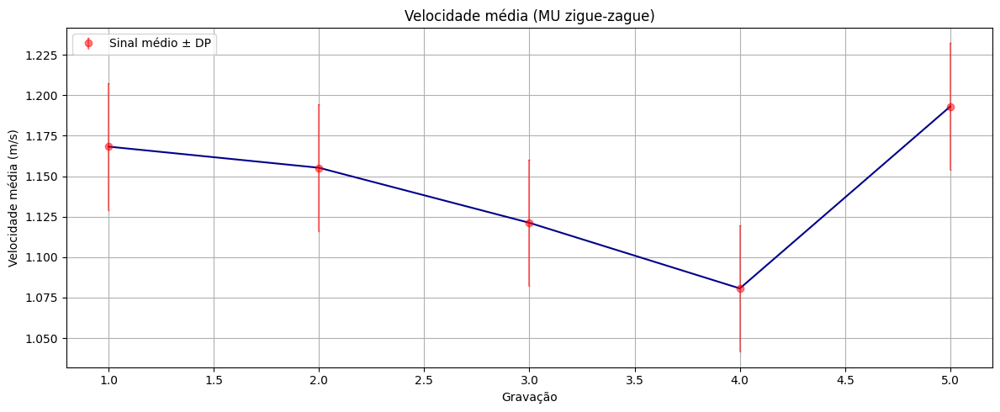

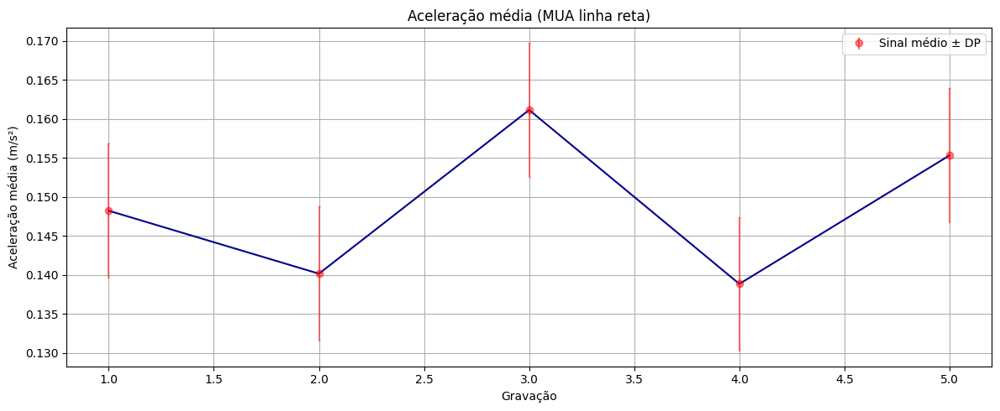

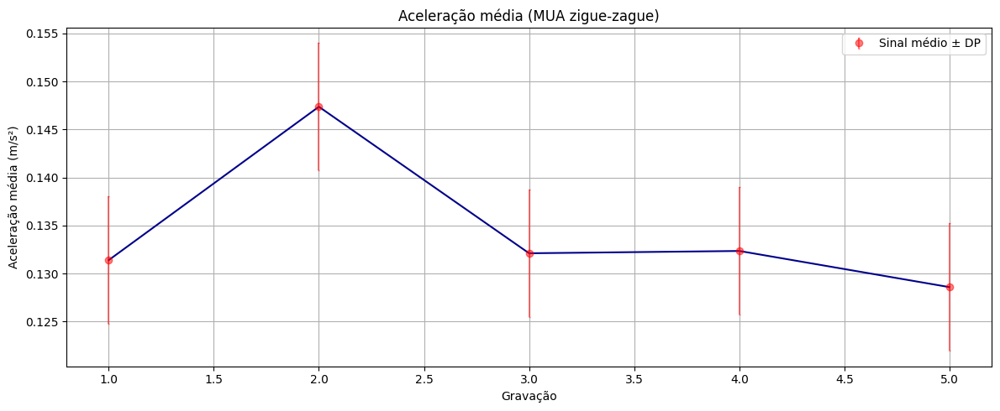

Timestamps médios (MU linha reta):
Euler:
t0: 0 desvio padrão: 0
t1: 6.196980000000403 desvio padrão: 0.34328743000593354
t2: 12.471879999998523 desvio padrão: 0.6908507983634895
t3: 18.74679999999993 desvio padrão: 1.038474342486436
t4: 25.02180000000759 desvio padrão: 1.3860088311423904
Velocidade média (Euler): 1.2828743433853507 desvio padrão: 0.07219836331587903
Aceleração média (Euler): 0.10318619903636789 desvio padrão: 0.011720444004211069
Analítico:
t0: 0 desvio padrão: 0
t1: 6.196980000000403 desvio padrão: 0.34328743000593354
t2: 12.471879999998523 desvio padrão: 0.6908507983634895
t3: 18.74679999999993 desvio padrão: 1.038474342486436
t4: 25.02180000000759 desvio padrão: 1.3860088311423904
Velocidade média (Analítico): 1.2828743433853507 desvio padrão: 0.07219836331587903
Aceleração média (Analítico): 0.10318619903636789 desvio padrão: 0.011720444004211069


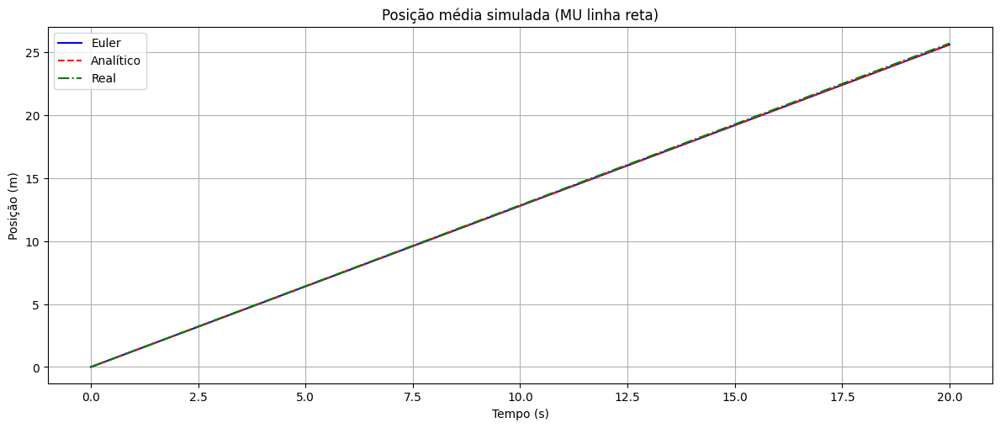

Timestamps médios (MU zigue-zague):
Euler:
t0: 0 desvio padrão: 0
t1: 6.923860000000647 desvio padrão: 0.2022040563392023
t2: 13.93489999999772 desvio padrão: 0.40681707191293803
t3: 20.945960000002618 desvio padrão: 0.6116603946643223
t4: 27.956960000011186 desvio padrão: 0.8162674551895527
Velocidade média (Euler): 1.1455919819550697 desvio padrão: 0.03344132646703182
Aceleração média (Euler): 0.08209370696472622 desvio padrão: 0.004796895215618193
Analítico:
t0: 0 desvio padrão: 0
t1: 6.923860000000647 desvio padrão: 0.2022040563392023
t2: 13.93489999999772 desvio padrão: 0.40681707191293803
t3: 20.945960000002618 desvio padrão: 0.6116603946643223
t4: 27.956960000011186 desvio padrão: 0.8162674551895527
Velocidade média (Analítico): 1.1455919819550697 desvio padrão: 0.03344132646703182
Aceleração média (Analítico): 0.08209370696472622 desvio padrão: 0.004796895215618193


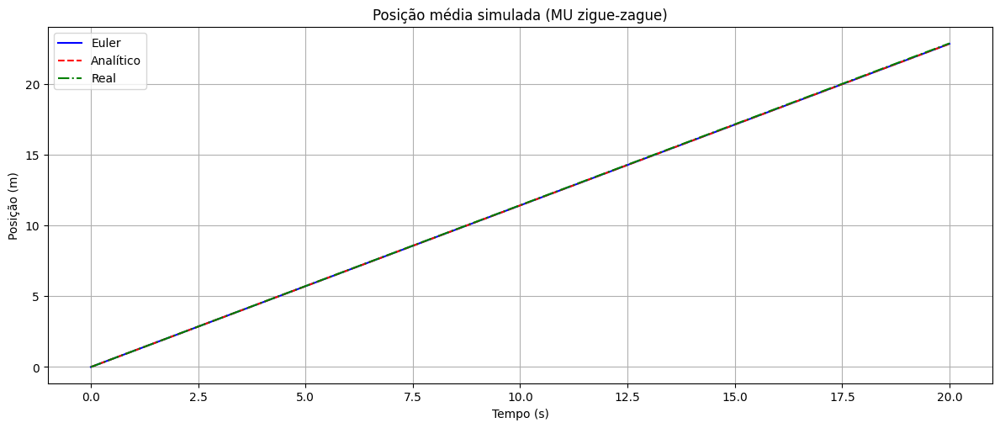

Timestamps médios (MUA linha reta):
Euler:
t0: 0 desvio padrão: 0
t1: 10.300979999999727 desvio padrão: 0.2951038115645128
t2: 14.613399999997341 desvio padrão: 0.41860477780336636
t3: 17.916239999998915 desvio padrão: 0.5133362469187658
t4: 20.698600000002312 desvio padrão: 0.5930317698073685
Velocidade média (Euler): 1.5472764666582668 desvio padrão: 0.044655004456138195
Aceleração média (Euler): 0.14975365835609178 desvio padrão: 0.008682657548787942
Analítico:
t0: 0 desvio padrão: 0
t1: 10.300539999999726 desvio padrão: 0.29517663931941407
t2: 14.612999999997337 desvio padrão: 0.4187378654955934
t3: 17.91575999999891 desvio padrão: 0.513308700881491
t4: 20.69804000000231 desvio padrão: 0.5930550045323449
Velocidade média (Analítico): 1.5473184756839242 desvio padrão: 0.04465838575432894
Aceleração média (Analítico): 0.1497618022881879 desvio padrão: 0.008683479558293558


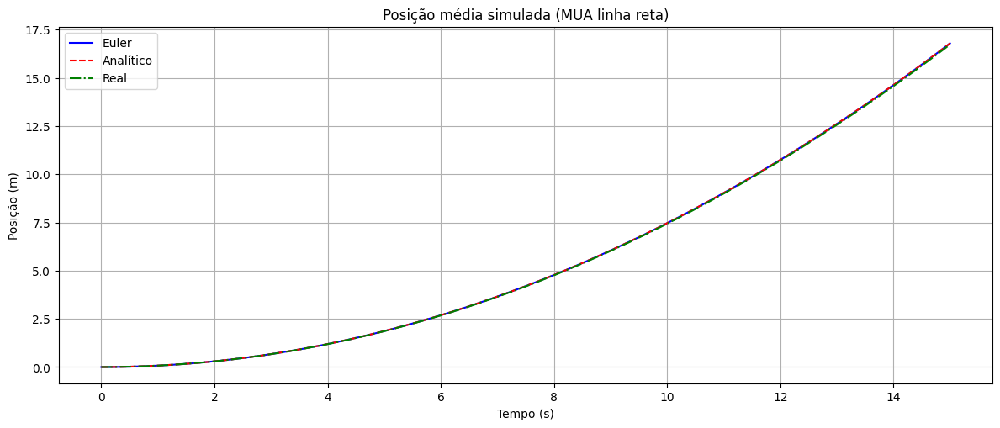

Timestamps médios (MUA zigue-zague):
Euler:
t0: 0 desvio padrão: 0
t1: 10.85981999999942 desvio padrão: 0.32862962069764845
t2: 15.406299999996957 desvio padrão: 0.46620215572206014
t3: 18.888280000000098 desvio padrão: 0.5715789023405242
t4: 21.82152000000368 desvio padrão: 0.6603895589733881
Velocidade média (Euler): 1.4677786669582094 desvio padrão: 0.04421605159673017
Aceleração média (Euler): 0.1347705796497764 desvio padrão: 0.008112373529098965
Analítico:
t0: 0 desvio padrão: 0
t1: 10.85935999999942 desvio padrão: 0.32868427160404295
t2: 15.405679999996957 desvio padrão: 0.46623240728192195
t3: 18.8876800000001 desvio padrão: 0.5716290909329219
t4: 21.82104000000368 desvio padrão: 0.6603229500790244
Velocidade média (Analítico): 1.467810740324699 desvio padrão: 0.04421347379299261
Aceleração média (Analítico): 0.1347764500423365 desvio padrão: 0.008112082134881262


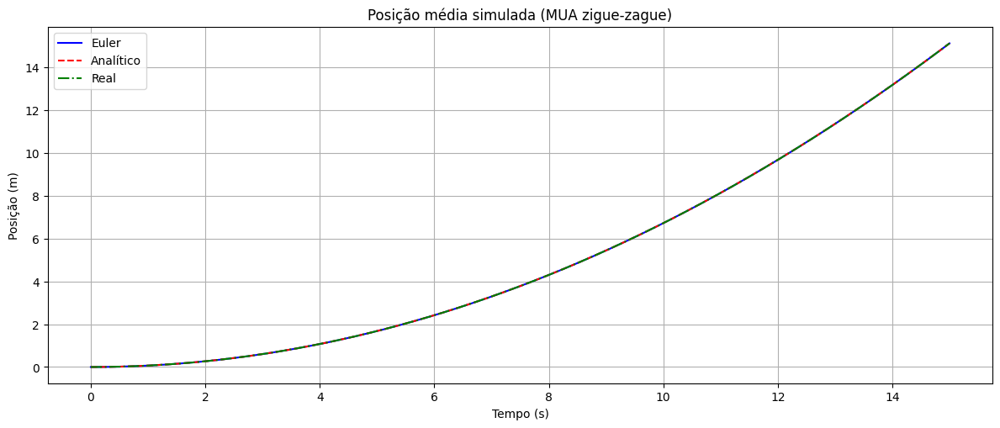

In [ ]:
# Interval amostrado para a base de dados em uso
# [0,5,10,15,22.5] # MU em linha reta
# [0,5,12.5,20,25] # MU em zigue-zague
# [0,5,10,15,20]   # MUA em linha reta
# [0,5,10,15,20]   # MUA em zigue-zague

tu = timeST("Uniforme",[0,5,10,15,22.5])
tzu = timeST("Zuniforme",[0,5,12.5,20,25])
tuv = timeST("Uniformevar",[0,5,10,15,20])
tzuv = timeST("Zuniformevar",[0,5,10,15,20])

# Velocidades médias
all_vtu = getV(tu)
all_vtzu = getV(tzu)
all_vtuv = getV(tuv)
all_vtzuv = getV(tzuv)
# Médias
v_tu = np.mean(all_vtu)
v_tzu = np.mean(all_vtzu)
v_tuv = np.mean(all_vtuv)
v_tzuv = np.mean(all_vtzuv)
# Desvios padrões
std_vtu = np.std(all_vtu)
std_vtzu = np.std(all_vtzu)
std_vtuv = np.std(all_vtuv)
std_vtzuv = np.std(all_vtzuv)


# Acelerações médias
all_atu = getA(tu)
all_atzu = getA(tzu)
all_atuv = getA(tuv)
all_atzuv = getA(tzuv)
# Médias
a_tu = np.mean(all_atu)
a_tzu = np.mean(all_atzu)
a_tuv = np.mean(all_atuv)
a_tzuv = np.mean(all_atzuv)
# Desvios padrões
std_atu = np.std(all_atu)
std_atzu = np.std(all_atzu)
std_atuv = np.std(all_atuv)
std_atzuv = np.std(all_atzuv)



# Prints
print()
for i in range(5):
  print("Velocidade média (MU linha reta) na gravação", i+1, "-", all_vtu[i])
print("Média:",v_tu)
print("Desvio padrão:",std_vtu)
print()
for i in range(5):
  print("Aceleração média (MU linha reta) na gravação", i+1, "-", all_atu[i])
print("Média:",a_tu)
print("Desvio padrão:",std_atu)
print()
for i in range(5):
  print("Velocidade média (MU zigue-zague) na gravação", i+1, "-", all_vtzu[i])
print("Média:",v_tzu)
print("Desvio padrão:",std_vtzu)
print()
for i in range(5):
  print("Aceleração média (MU zigue-zague) na gravação", i+1, "-", all_atzu[i])
print("Média:",a_tzu)
print("Desvio padrão:",std_atzu)
print()
for i in range(5):
  print("Velocidade média (MUA linha reta) na gravação", i+1, "-", all_vtuv[i])
print("Média:",v_tuv)
print("Desvio padrão:",std_vtuv)
print()
for i in range(5):
  print("Aceleração média (MUA linha reta) na gravação", i+1, "-", all_atuv[i])
print("Média:",a_tuv)
print("Desvio padrão:",std_atuv)
print()
for i in range(5):
  print("Velocidade média (MUA zigue-zague) na gravação", i+1, "-", all_vtzuv[i])
print("Média:",v_tzuv)
print("Desvio padrão:",std_vtzuv)
for i in range(5):
  print("Aceleração média (MUA zigue-zague) na gravação", i+1, "-", all_atzuv[i])
print("Média:",a_tzuv)
print("Desvio padrão:",std_atzuv)

# Plots
plotV(all_vtu, std_vtu,"Velocidade média (MU linha reta)")
plotV(all_vtzu, std_vtzu,"Velocidade média (MU zigue-zague)")
plotA(all_atuv, std_atuv,"Aceleração média (MUA linha reta)")
plotA(all_atzuv, std_atzuv,"Aceleração média (MUA zigue-zague)")

# Simulações
all_k = [v_tu,v_tzu,a_tuv,a_tzuv]
all_std = [std_vtu, std_vtzu, std_atuv, std_atzuv]
simulateMU(all_k,all_std,50)




